In [110]:
#Lectura de datos
library(stats)
library("ggplot2")
library("geojsonio")
library("broom")
library(tidyverse)
data <- read.csv('propuestas_ganadoras.csv', header=TRUE, sep=",")
head(data)
library("jsonlite")
library("leaflet")
library(tmap)
library(cowplot)
#read json con los poligonos
library("sf")
radios <- st_read("ComunasBuenosAires.geojson")
#Geoson comunas de la ciudad de Buenos Aires
head(radios)

dataPuntos <- read.csv('CategoriasMapas.csv', header = TRUE, sep = ",", dec = ".",
                          comment.char = "", strip.white = TRUE,
                         stringsAsFactors = TRUE, encoding="UTF-8")
head(dataPuntos)



,Periodo,Categoria,Comuna,Propuesta,Votos,lat,lng
,<int>,<fct>,<fct>,<fct>,<int>,<dbl>,<dbl>
1,2017,Plazas y parques,Comuna 1,Seguridad y salud,153,-34.6163,-58.3803
2,2017,Ferias y Mercados,Comuna 1,Creaci?n mercado central en retiro,217,-34.6073,-58.3753
3,2017,Movilidad y transito,Comuna 1,Seguridad peatonal y vehicular en cruce av san juan y av nueve de julio,307,-34.6113,-58.3763
4,2017,Deportes y calidad de vida,Comuna 1,Yoga en los parques,263,-34.6093,-58.3753
5,2017,Ferias y Mercados,Comuna 1,Horario de las ferias,148,-34.6123,-58.3793
6,2017,Arte urbano,Comuna 1,Mural en chacabuco al 800,93,-34.6073,-58.3783


Reading layer `ComunasBuenosAires' from data source `/Users/samuel/Desktop/Juan Maestría/Eli/ComunasBuenosAires.geojson' using driver `GeoJSON'
Simple feature collection with 15 features and 12 fields
geometry type:  MULTIPOLYGON
dimension:      XY
bbox:           xmin: -58.53152 ymin: -34.70529 xmax: -58.33515 ymax: -34.52649
epsg (SRID):    4326
proj4string:    +proj=longlat +datum=WGS84 +no_defs


,stroke,stroke.width,stroke.opacity,fill,fill.opacity,BARRIOS,PERIMETRO,AREA,COMUNAS,ID,OBJETO,Comuna,geometry
,<fct>,<int>,<int>,<fct>,<dbl>,<fct>,<dbl>,<dbl>,<int>,<int>,<fct>,<fct>,<MULTIPOLYGON [°]>
1,#555555,2,1,#555555,0.5,RECOLETA,21452.84,6317265,2,1,LIMITE COMUNAL,Comuna 2,MULTIPOLYGON (((-58.38 -34....
2,#555555,2,1,#555555,0.5,ALMAGRO - BOEDO,12323.43,6660603,5,2,LIMITE COMUNAL,Comuna 5,MULTIPOLYGON (((-58.41287 -...
3,#555555,2,1,#555555,0.5,CABALLITO,10990.96,6851029,6,3,LIMITE COMUNAL,Comuna 6,MULTIPOLYGON (((-58.43061 -...
4,#555555,2,1,#555555,0.5,FLORES - PARQUE CHACABUCO,17972.26,12422901,7,4,LIMITE COMUNAL,Comuna 7,MULTIPOLYGON (((-58.452 -34...
5,#555555,2,1,#555555,0.5,LINIERS - MATADEROS - PARQUE AVELLANEDA,21411.74,16505306,9,5,LIMITE COMUNAL,Comuna 9,MULTIPOLYGON (((-58.51925 -...
6,#555555,2,1,#555555,0.5,FLORESTA - MONTE CASTRO - VELEZ SARSFIELD - VERSALLES - VILLA LURO - VILLA REAL,18332.04,12656557,10,6,LIMITE COMUNAL,Comuna 10,MULTIPOLYGON (((-58.48834 -...


,Periodo,Categoria,Comuna,Propuesta,Votos,lat,lng,color
,<int>,<fct>,<fct>,<fct>,<int>,<dbl>,<dbl>,<fct>
1,2017,Plazas y parques,Comuna 1,Seguridad y salud,153,-34.6132,-58.3779,#85E45D
2,2017,Ferias y Mercados,Comuna 1,Creaci?n mercado central en retiro,217,-34.5902,-58.3729,#9573D9
3,2017,Movilidad y transito,Comuna 1,Seguridad peatonal y vehicular en cruce av san juan y av nueve de julio,307,-34.6220,-58.3810,#86A0DB
4,2017,Deportes y calidad de vida,Comuna 1,Yoga en los parques,263,-34.6009,-58.3845,#9DDBDF
5,2017,Ferias y Mercados,Comuna 1,Horario de las ferias,148,-34.6160,-58.3732,#9573D9
6,2017,Arte urbano,Comuna 1,Mural en chacabuco al 800,93,-34.6174,-58.3732,BB45E0


In [111]:

leaflet(data = radios) %>%
  addTiles() %>%
  addPolygons(label = ~Comuna,
              color = "#444444",
              weight = 1,
              smoothFactor = 0.5,
              opacity = 1.0,
              fillOpacity = 0.5,
              highlightOptions = highlightOptions(color = "white",
                                                  weight = 2,
                                                  bringToFront = TRUE)) %>%
  addCircleMarkers(lng = dataPuntos$lng, radius =3, lat = dataPuntos$lat, color = "red")

HTML widgets cannot be represented in plain text (need html)

 [1] "#DA746E" "#88D7D7" "#84DE9A" "#D6D5AE" "#9D4DE0" "#D5B9D2" "#DBD35D"
 [8] "#D66FC5" "#7D98D8" "#87E657"


Warning message in st_point_on_surface.sfc(sf::st_zm(x)):
“st_point_on_surface may not give correct results for longitude/latitude data”


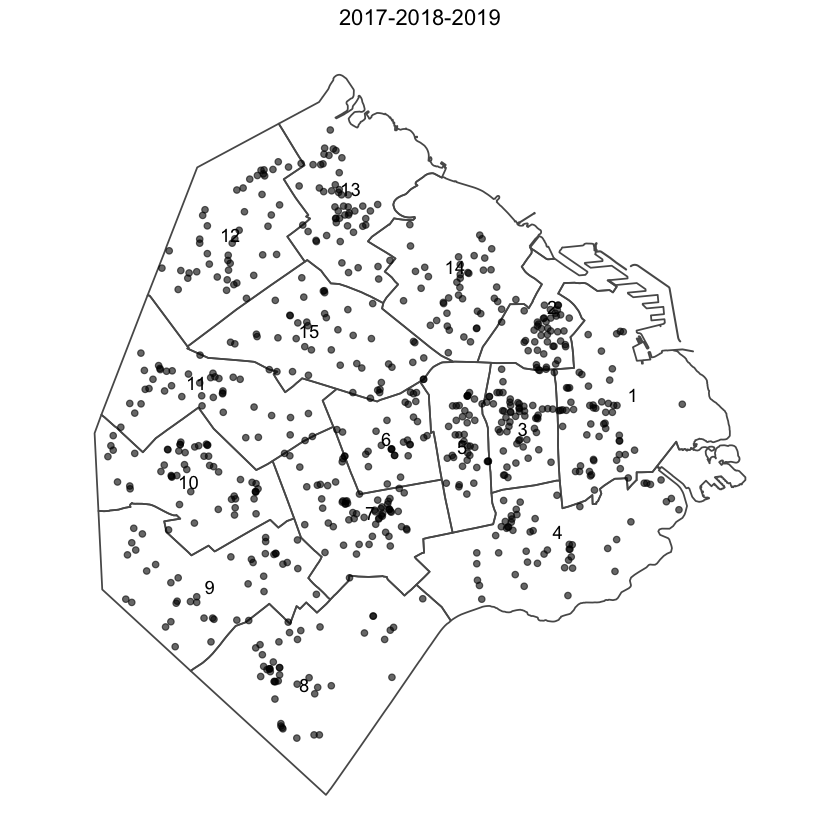

In [112]:

color  <-  grDevices::colors()[grep('gr(a|e)y', grDevices::colors(), invert = T)]
#png(file = "TresCategoriasTodosAnos.png")
library(randomcoloR)
n <- 10
palette <- distinctColorPalette(n)
print(palette)

ggplot(radios) +
    geom_sf(data=radios, fill=NA)+
    geom_point(data = dataPuntos, aes(x = lng, y = lat), alpha = .6)+
    scale_color_manual(values=c(palette)) + 
    geom_sf_text(aes(label = COMUNAS))+
    theme_minimal()+
    coord_sf(datum = NA)+
    theme(axis.title.x=element_blank(),
        axis.text.x=element_blank(),
        axis.ticks.x=element_blank(),
         axis.title.y=element_blank(),
        axis.text.y=element_blank(),
        axis.ticks.y=element_blank(),
        plot.title = element_text(hjust = 0.5))+
    ggtitle("2017-2018-2019") 
#dev.off()

<h1>2017 </h1>

In [8]:
dataPuntosTest  <- filter(dataPuntos, Periodo == 2017)
leaflet(data = radios) %>%
  addTiles() %>%
  addPolygons(label = ~Comuna,
              color = "#444444",
              weight = 1,
              smoothFactor = 0.5,
              opacity = 1.0,
              fillOpacity = 0.5,
              highlightOptions = highlightOptions(color = "white",
                                                  weight = 2,
                                                  bringToFront = TRUE)) %>%
  addCircleMarkers(lng = dataPuntosTest$lng, radius =3, lat = dataPuntosTest$lat, color = "red")


HTML widgets cannot be represented in plain text (need html)

<h1>2018 </h1>

In [9]:
dataPuntosTest  <- filter(dataPuntos, Periodo == 2018)
leaflet(data = radios) %>%
  addTiles() %>%
  addPolygons(label = ~Comuna,
              color = "#444444",
              weight = 1,
              smoothFactor = 0.5,
              opacity = 1.0,
              fillOpacity = 0.5,
              highlightOptions = highlightOptions(color = "white",
                                                  weight = 2,
                                                  bringToFront = TRUE)) %>%
  addCircleMarkers(lng = dataPuntosTest$lng, radius =3, lat = dataPuntosTest$lat, color = "red")

HTML widgets cannot be represented in plain text (need html)

<h1>2019 </h1>

In [10]:
dataPuntosTest  <- filter(dataPuntos, Periodo == 2019)
leaflet(data = radios) %>%
  addTiles() %>%
  addPolygons(label = ~Comuna,
              color = "#444444",
              weight = 1,
              smoothFactor = 0.5,
              opacity = 1.0,
              fillOpacity = 0.5,
              highlightOptions = highlightOptions(color = "white",
                                                  weight = 2,
                                                  bringToFront = TRUE)) %>%
  addCircleMarkers(lng = dataPuntosTest$lng, radius =3, lat = dataPuntosTest$lat, color = "red")

HTML widgets cannot be represented in plain text (need html)

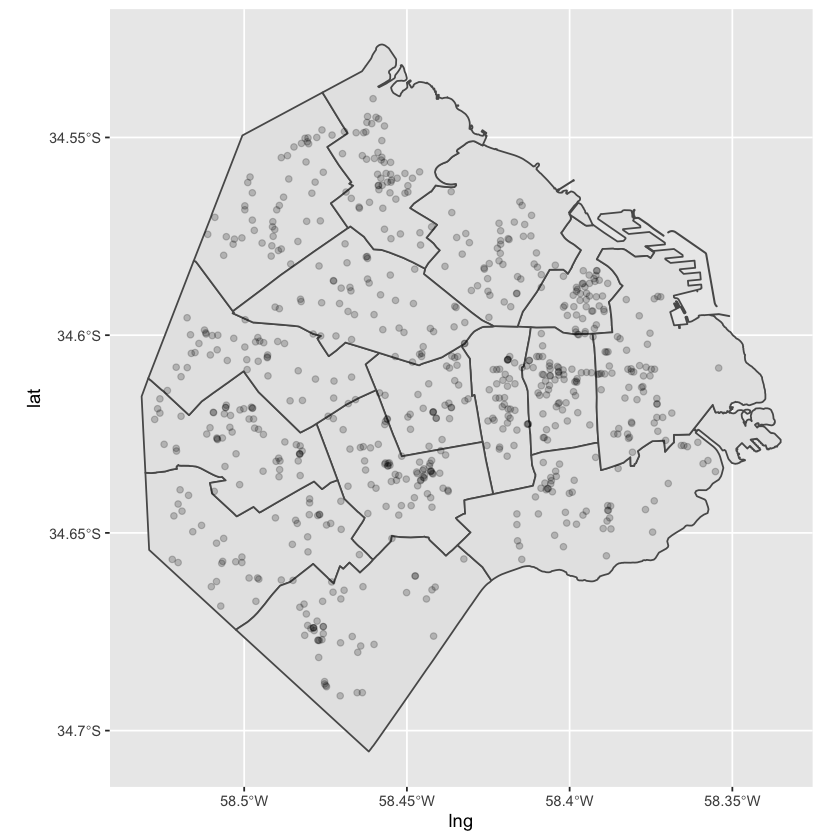

In [11]:
ggplot() +
    geom_sf(data=radios)+
    geom_point(data = dataPuntos, aes(x = lng, y = lat), 
              fill = "grey", color = "black", alpha = .2)+
   
    scale_color_viridis_c() 

# A tibble: 10 x 2
   Categoria                      n
   <fct>                      <int>
 1 Arte urbano                   18
 2 Cultura                        8
 3 Deportes y calidad de vida    41
 4 Educacion                     19
 5 Ferias y Mercados             23
 6 Innovacion                    18
 7 Mascotas                       2
 8 Movilidad y transito          53
 9 Plazas y parques              43
10 Reciclado                     14


Warning message in st_point_on_surface.sfc(sf::st_zm(x)):
“st_point_on_surface may not give correct results for longitude/latitude data”


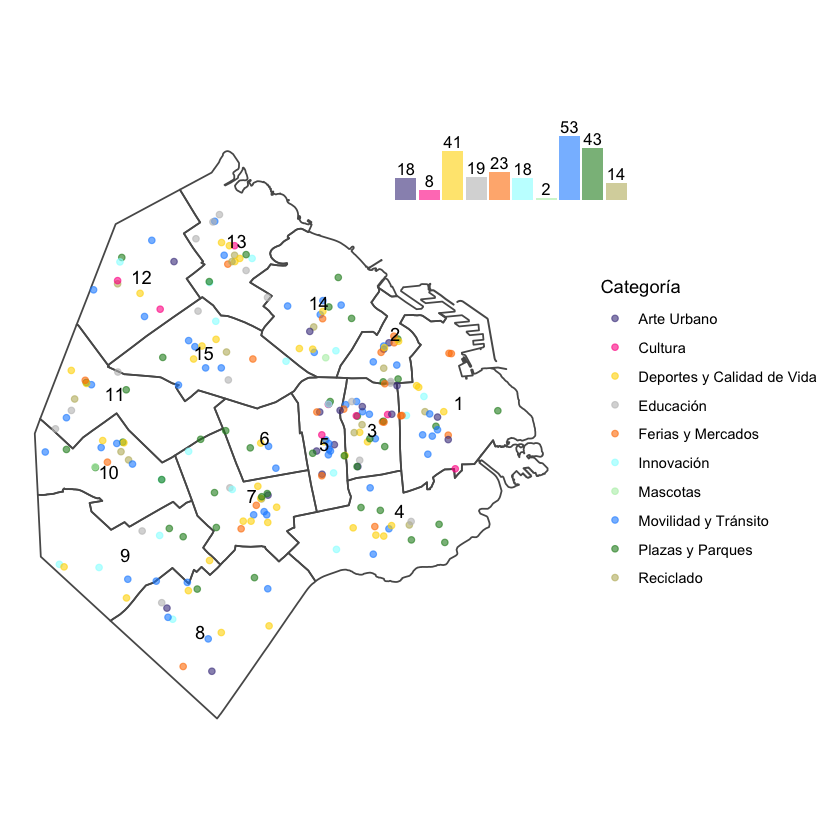

In [122]:
library(patchwork)
dt <- filter(dataPuntos, Periodo == 2017)
counts  <- dt %>% group_by(Categoria) %>% tally()
print(counts)
histograma  <- ggplot(data=counts, aes(x=Categoria, y=n, fill=Categoria)) +
                  geom_bar(stat="identity", alpha = .6, show.legend = FALSE)+
                  geom_text(aes(label=n), vjust=-0.3, size=3.5)+
                  theme_minimal()+labs(x="", y = "Frecuencia", title = "")+coord_cartesian(ylim = c(0, 200))+
                  theme(axis.title.x=element_blank(), 
                    panel.grid.major = element_blank(),
                    panel.grid.minor = element_blank(),
                    axis.text.x=element_blank(),
                    axis.ticks.x=element_blank(),
                    axis.title.y=element_blank(),
                    axis.text.y=element_blank(),
                    axis.ticks.y=element_blank(),
                    plot.title = element_text(hjust = 0.5))+
                    scale_fill_manual(values=c("darkslateblue", "deeppink1","gold1", "grey","darkorange1","darkslategray1", "darkseagreen2","dodgerblue1", "forestgreen","darkkhaki"))

mapa  <- ggplot(radios) +
        geom_sf(data=radios, fill=NA)+
            geom_point(data = dt, aes(x = lng, y = lat, colour = Categoria ),  alpha = .6)+
            scale_colour_manual(values=c("darkslateblue", "deeppink1","gold1", "grey","darkorange1","darkslategray1", "darkseagreen2","dodgerblue1", "forestgreen","darkkhaki"),
                               labels = c("Arte Urbano", "Cultura", "Deportes y Calidad de Vida","Educación","Ferias y Mercados", "Innovación","Mascotas","Movilidad y Tránsito","Plazas y Parques","Reciclado"))+
            geom_sf_text(aes(label = COMUNAS))+
            theme_minimal()+
            coord_sf(datum = NA)+
            theme(axis.title.x=element_blank(),
                axis.text.x=element_blank(),
                axis.ticks.x=element_blank(),
                 axis.title.y=element_blank(),
                axis.text.y=element_blank(),
                axis.ticks.y=element_blank(),
                plot.title = element_text(hjust = 0.5))+
            ggtitle("") + labs(color="Categoría")

#pdf(file = "MapasAno2017.pdf")
mapa + annotation_custom(ggplotGrob(histograma), xmin = -58.4, xmax = -58.30,
                       ymin = -34.55, ymax = -34.45)
#dev.off()

# A tibble: 10 x 2
   Categoria                      n
   <fct>                      <int>
 1 Arte urbano                    4
 2 Cultura                        8
 3 Deportes y calidad de vida    16
 4 Ferias y Mercados              8
 5 Innovacion                     9
 6 Mascotas                      15
 7 Movilidad y transito         133
 8 Plazas y parques              47
 9 Reciclado                      1
10 Seguridad                    178


Warning message in st_point_on_surface.sfc(sf::st_zm(x)):
“st_point_on_surface may not give correct results for longitude/latitude data”


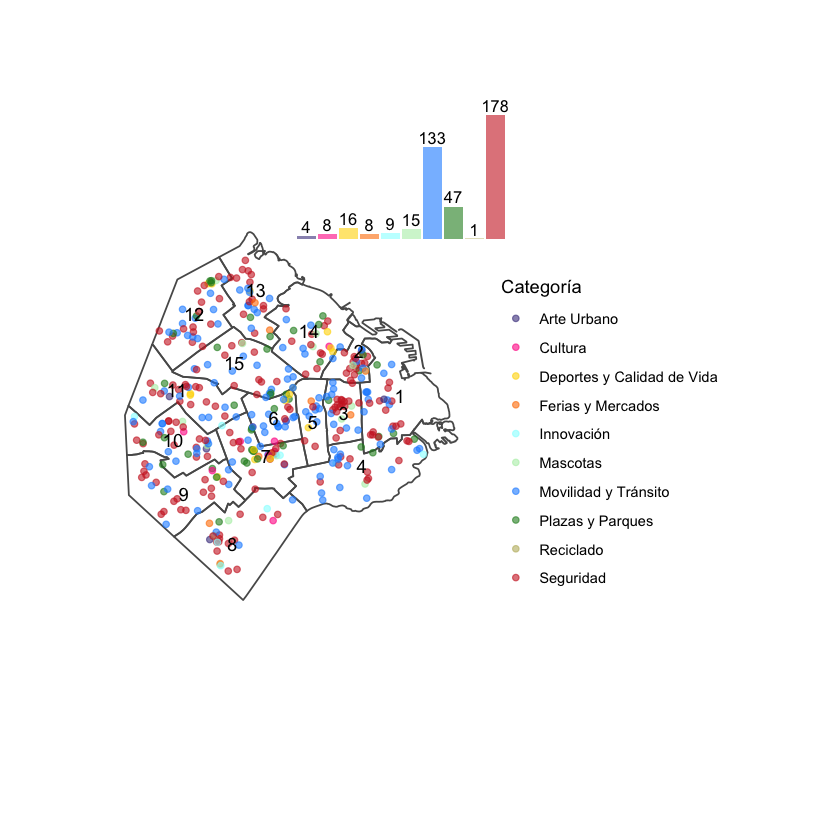

In [15]:
library(patchwork)
dt <- filter(dataPuntos, Periodo == 2018)
counts  <- dt %>% group_by(Categoria) %>% tally()
print(counts)
histograma  <- ggplot(data=counts, aes(x=Categoria, y=n, fill=Categoria)) +
                  geom_bar(stat="identity", alpha = .6, show.legend = FALSE)+
                  geom_text(aes(label=n), vjust=-0.3, size=3.5)+
                  theme_minimal()+labs(x="", y = "Frecuencia", title = "")+coord_cartesian(ylim = c(0, 200))+
                 theme(axis.title.x=element_blank(), 
                    panel.grid.major = element_blank(),
                    panel.grid.minor = element_blank(),
                    axis.text.x=element_blank(),
                    axis.ticks.x=element_blank(),
                    axis.title.y=element_blank(),
                    axis.text.y=element_blank(),
                    axis.ticks.y=element_blank(),
                    plot.title = element_text(hjust = 0.5))+
                    scale_fill_manual(values=c("darkslateblue", "deeppink1","gold1", "darkorange1","darkslategray1", "darkseagreen2","dodgerblue1", "forestgreen","darkkhaki", "firebrick3"))




#png(file = "TresCategoriasTodosAnos.png")
mapa  <- ggplot(radios) +
        geom_sf(data=radios, fill=NA)+
            geom_point(data = dt, aes(x = lng, y = lat, colour = Categoria ),  alpha = .6)+
            scale_colour_manual(values=c("darkslateblue", "deeppink1","gold1", "darkorange1","darkslategray1", "darkseagreen2","dodgerblue1", "forestgreen","darkkhaki", "firebrick3"),
                               labels = c("Arte Urbano", "Cultura", "Deportes y Calidad de Vida","Ferias y Mercados", "Innovación","Mascotas","Movilidad y Tránsito","Plazas y Parques","Reciclado","Seguridad"))+
            geom_sf_text(aes(label = COMUNAS))+
            theme_minimal()+
            coord_sf(datum = NA)+
            theme(axis.title.x=element_blank(),
                axis.text.x=element_blank(),
                axis.ticks.x=element_blank(),
                 axis.title.y=element_blank(),
                axis.text.y=element_blank(),
                axis.ticks.y=element_blank(),
                plot.title = element_text(hjust = 0.5))+
            ggtitle("") + labs(color="Categoría")+
                    ylim(-34.8, -34.45)



#pdf(file = "MapasAno2018.pdf")
mapa + annotation_custom(ggplotGrob(histograma), xmin = -58.44, xmax = -58.30,
                      ymin = -34.54, ymax = -34.44)
#dev.off()


Attaching package: ‘patchwork’


The following object is masked from ‘package:cowplot’:

    align_plots




# A tibble: 9 x 2
  Categoria                      n
  <fct>                      <int>
1 Cultura                        2
2 Deportes y calidad de vida     2
3 Educacion                      3
4 Innovacion                     3
5 Mascotas                       1
6 Movilidad y transito          17
7 Plazas y parques               5
8 Reciclado                      1
9 Seguridad                     26


Warning message in st_point_on_surface.sfc(sf::st_zm(x)):
“st_point_on_surface may not give correct results for longitude/latitude data”


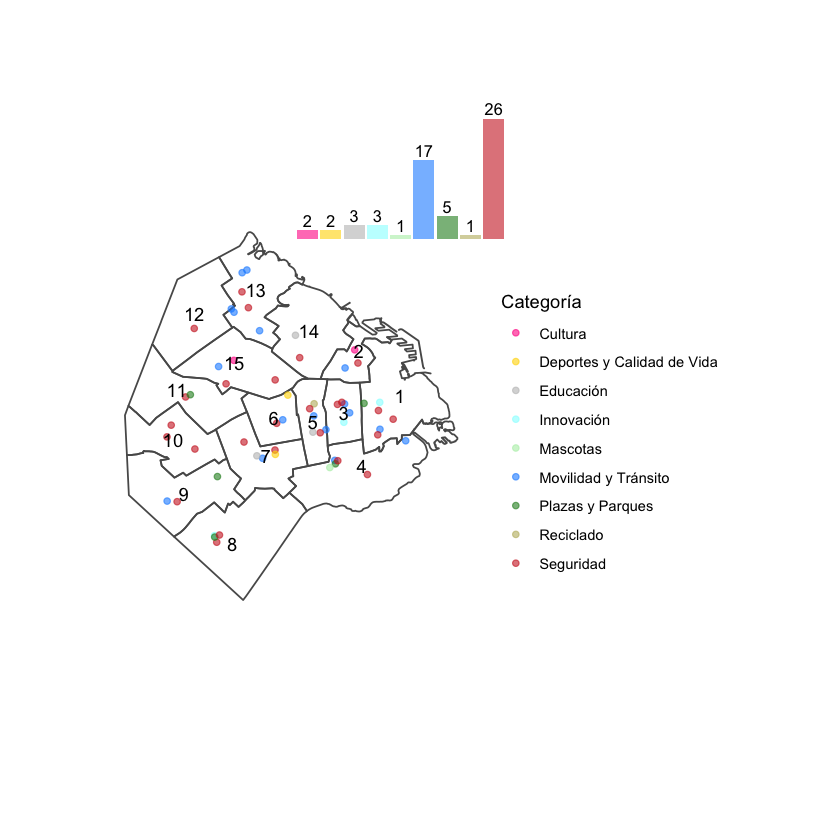

In [121]:
library(patchwork)
dt <- filter(dataPuntos, Periodo == 2019)
counts  <- dt %>% group_by(Categoria) %>% tally()
print(counts)
histograma  <- ggplot(data=counts, aes(x=Categoria, y=n, fill=Categoria)) +
                  geom_bar(stat="identity", alpha = .6, show.legend = FALSE)+
                  geom_text(aes(label=n), vjust=-0.3, size=3.5)+
                  theme_minimal()+labs(x="", y = "Frecuencia", title = "")+coord_cartesian(ylim = c(0, 30))+
                  theme(axis.title.x=element_blank(), 
                    panel.grid.major = element_blank(),
                    panel.grid.minor = element_blank(),
                    axis.text.x=element_blank(),
                    axis.ticks.x=element_blank(),
                    axis.title.y=element_blank(),
                    axis.text.y=element_blank(),
                    axis.ticks.y=element_blank(),
                    plot.title = element_text(hjust = 0.5))+
                    scale_fill_manual(values=c("deeppink1","gold1", "grey", "darkslategray1", "darkseagreen2","dodgerblue1", "forestgreen","darkkhaki","firebrick3"))





#png(file = "TresCategoriasTodosAnos.png")
mapa  <- ggplot(radios) +
        geom_sf(data=radios, fill=NA)+
            geom_point(data = dt, aes(x = lng, y = lat, colour = Categoria ),  alpha = .6)+
                scale_colour_manual(values=c("deeppink1","gold1", "grey", "darkslategray1", "darkseagreen2","dodgerblue1", "forestgreen","darkkhaki","firebrick3"),
                                        labels = c("Cultura", "Deportes y Calidad de Vida","Educación", "Innovación","Mascotas","Movilidad y Tránsito","Plazas y Parques","Reciclado","Seguridad"))+
            geom_sf_text(aes(label = COMUNAS))+
            theme_minimal()+
            coord_sf(datum = NA)+
            theme(axis.title.x=element_blank(),
                axis.text.x=element_blank(),
                axis.ticks.x=element_blank(),
                 axis.title.y=element_blank(),
                axis.text.y=element_blank(),
                axis.ticks.y=element_blank(),
                plot.title = element_text(hjust = 0.5))+
            ggtitle("") + 
       labs(color="Categoría")+
                    ylim(-34.8, -34.45)

#pdf(file = "MapasAno2019.pdf")
mapa + annotation_custom(ggplotGrob(histograma), xmin = -58.44, xmax = -58.30,
                       ymin = -34.54, ymax = -34.44)
#dev.off()

In [2]:
library(patchwork)
dt <- filter(dataPuntos, Periodo == 2017)
counts  <- dt %>% group_by(Categoria) %>% tally()

histograma  <- ggplot(data=counts, aes(x=Categoria, y=n, fill=Categoria)) +
                  geom_bar(stat="identity", alpha = .6, show.legend = FALSE)+
                  geom_text(aes(label=n), vjust=-0.3, size=3.5)+
                  theme_minimal()+labs(x="", y = "Frecuencia", title = "")+coord_cartesian(ylim = c(0, 200))+
                  theme(panel.border = element_blank(), panel.grid.major = element_blank(),
panel.grid.minor = element_blank(), axis.line = element_blank(), axis.text.x=element_text(angle=90,hjust=1,vjust=0.5,face="bold", colour = "black"), )+
                    scale_fill_manual(values=c("darkslateblue", "deeppink1","gold1", "grey","darkorange1","darkslategray1", "darkseagreen2","dodgerblue1", "forestgreen","darkkhaki"))





#png(file = "TresCategoriasTodosAnos.png")
mapa  <- ggplot(radios) +
        geom_sf(data=radios, fill=NA)+
            geom_point(data = dt, aes(x = lng, y = lat, colour = Categoria ),  alpha = .6)+
            scale_colour_manual(values=c("darkslateblue", "deeppink1","gold1", "grey","darkorange1","darkslategray1", "darkseagreen2","dodgerblue1", "forestgreen","darkkhaki"))+
            geom_sf_text(aes(label = COMUNAS))+
            theme_minimal()+
            coord_sf(datum = NA)+
            theme(axis.title.x=element_blank(),
                axis.text.x=element_blank(),
                axis.ticks.x=element_blank(),
                 axis.title.y=element_blank(),
                axis.text.y=element_blank(),
                axis.ticks.y=element_blank(),
                plot.title = element_text(hjust = 0.5))+
            ggtitle("") + labs(color="Categoría")
#dev.off()
library(ggpubr)


ggarrange(
  mapa,                # First row with line plot
  # Second row with box and dot plots
  ggarrange(histograma, ncol = 2, labels = c("B")), 
  nrow = 2, 
  labels = "A"       # Label of the line plot
  ) 



ERROR: Error in as.ts(x): object 'dataPuntos' not found


Warning message in st_point_on_surface.sfc(sf::st_zm(x)):
“st_point_on_surface may not give correct results for longitude/latitude data”


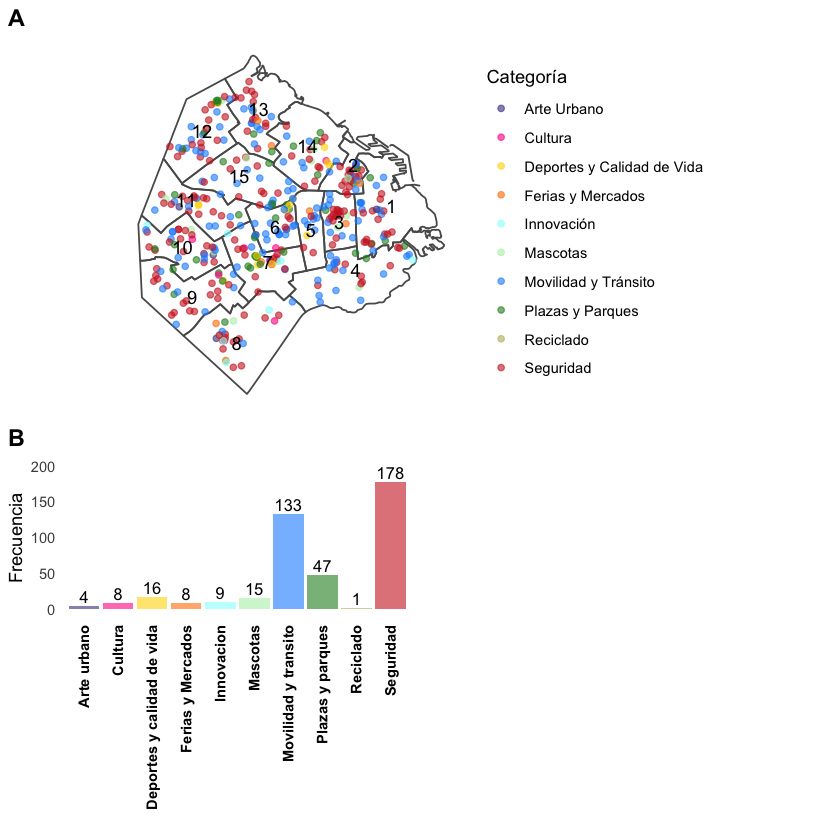

In [72]:
library(patchwork)
dt <- filter(dataPuntos, Periodo == 2018)
counts  <- dt %>% group_by(Categoria) %>% tally()

histograma  <- ggplot(data=counts, aes(x=Categoria, y=n, fill=Categoria)) +
                  geom_bar(stat="identity", alpha = .6, show.legend = FALSE)+
                  geom_text(aes(label=n), vjust=-0.3, size=3.5)+
                  theme_minimal()+labs(x="", y = "Frecuencia", title = "")+coord_cartesian(ylim = c(0, 200))+
                  theme(panel.border = element_blank(), panel.grid.major = element_blank(),
                        panel.grid.minor = element_blank(), axis.line = element_blank(), axis.text.x=element_text(angle=90,hjust=1,vjust=0.5,face="bold", colour = "black") )+
                    scale_fill_manual(values=c("darkslateblue", "deeppink1","gold1", "darkorange1","darkslategray1", "darkseagreen2","dodgerblue1", "forestgreen","darkkhaki", "firebrick3"))





#png(file = "TresCategoriasTodosAnos.png")
mapa  <- ggplot(radios) +
        geom_sf(data=radios, fill=NA)+
            geom_point(data = dt, aes(x = lng, y = lat, colour = Categoria ),  alpha = .6)+
            scale_colour_manual(values=c("darkslateblue", "deeppink1","gold1", "darkorange1","darkslategray1", "darkseagreen2","dodgerblue1", "forestgreen","darkkhaki", "firebrick3"),
                               labels = c("Arte Urbano", "Cultura", "Deportes y Calidad de Vida","Ferias y Mercados", "Innovación","Mascotas","Movilidad y Tránsito","Plazas y Parques","Reciclado","Seguridad"))+
            geom_sf_text(aes(label = COMUNAS))+
            theme_minimal()+
            coord_sf(datum = NA)+
            theme(axis.title.x=element_blank(),
                axis.text.x=element_blank(),
                axis.ticks.x=element_blank(),
                 axis.title.y=element_blank(),
                axis.text.y=element_blank(),
                axis.ticks.y=element_blank(),
                plot.title = element_text(hjust = 0.5))+
            ggtitle("") + labs(color="Categoría")
#dev.off()
library(ggpubr)


ggarrange(
  mapa,                # First row with line plot
  # Second row with box and dot plots
  ggarrange(histograma, ncol = 2, labels = c("B")), 
  nrow = 2, 
  labels = "A"       # Label of the line plot
  ) 


Warning message in st_point_on_surface.sfc(sf::st_zm(x)):
“st_point_on_surface may not give correct results for longitude/latitude data”


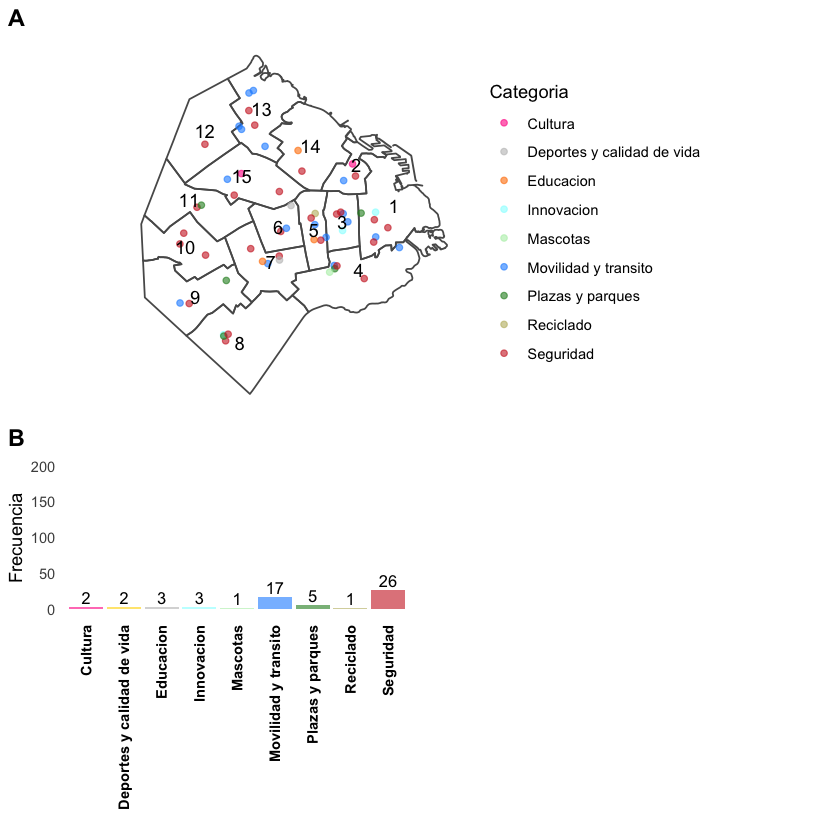

In [103]:
library(patchwork)
dt <- filter(dataPuntos, Periodo == 2019)
counts  <- dt %>% group_by(Categoria) %>% tally()

histograma  <- ggplot(data=counts, aes(x=Categoria, y=n, fill=Categoria)) +
                  geom_bar(stat="identity", alpha = .6, show.legend = FALSE)+
                  geom_text(aes(label=n), vjust=-0.3, size=3.5)+
                  theme_minimal()+labs(x="", y = "Frecuencia", title = "")+coord_cartesian(ylim = c(0, 200))+
                  theme(panel.border = element_blank(), panel.grid.major = element_blank(),
panel.grid.minor = element_blank(), axis.line = element_blank(), axis.text.x=element_text(angle=90,hjust=1,vjust=0.5,face="bold", colour = "black"), )+
                    scale_fill_manual(values=c("deeppink1","gold1", "grey", "darkslategray1", "darkseagreen2","dodgerblue1", "forestgreen","darkkhaki","firebrick3"))


#png(file = "TresCategoriasTodosAnos.png")
mapa  <- ggplot(radios) +
        geom_sf(data=radios, fill=NA)+
            geom_point(data = dt, aes(x = lng, y = lat, colour = Categoria ),  alpha = .6)+
                scale_colour_manual(values=c("deeppink1","grey", "darkorange1","darkslategray1", "darkseagreen2","dodgerblue1", "forestgreen","darkkhaki","firebrick3"))+
            geom_sf_text(aes(label = COMUNAS))+
            theme_minimal()+
            coord_sf(datum = NA)+
            theme(axis.title.x=element_blank(),
                axis.text.x=element_blank(),
                axis.ticks.x=element_blank(),
                 axis.title.y=element_blank(),
                axis.text.y=element_blank(),
                axis.ticks.y=element_blank(),
                plot.title = element_text(hjust = 0.5))+
            ggtitle("") 
#dev.off()
library(ggpubr)


ggarrange(
  mapa,                # First row with line plot
  # Second row with box and dot plots
  ggarrange(histograma, ncol = 2, labels = c("B")), 
  nrow = 2, 
  labels = "A"       # Label of the line plot
  ) 

<h1>Premacía de Propuestas Ganadoras por Comuna </h1>
Año 2017

# A tibble: 3 x 2
  Categoria                      n
  <fct>                      <int>
1 Deportes y calidad de vida     1
2 Movilidad y transito           2
3 Plazas y parques               2


Warning message in st_point_on_surface.sfc(sf::st_zm(x)):
“st_point_on_surface may not give correct results for longitude/latitude data”


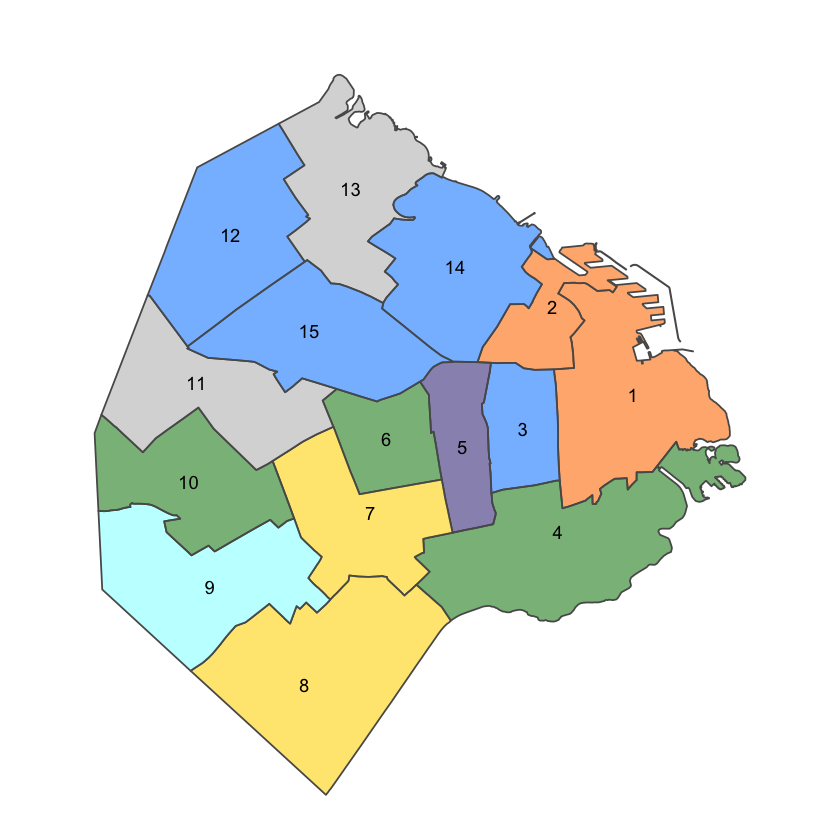

In [113]:

dt <- filter(dataPuntos, Periodo == 2017 & Comuna == "Comuna 6")

#En comuna 1 se encontraron repetidas las Categorias de: "Ferias y Mercados" y "Movilidad .." como ganadoras
radiosComuna1  <- filter(radios, Comuna == "Comuna 1")
radiosComuna2  <- filter(radios, Comuna == "Comuna 2")
radiosComuna3  <- filter(radios, Comuna == "Comuna 3")
radiosComuna4  <- filter(radios, Comuna == "Comuna 4")
#En comuna 5 se encontraron repetidas las Categorias de: "Arte urbano" y "Movilidad .." como ganadoras
radiosComuna5  <- filter(radios, Comuna == "Comuna 5")
#En comuna 6 se encontraron repetidas las Categorias de: "Plazas y Parques" y "Movilidad .." como ganadoras
radiosComuna6  <- filter(radios, Comuna == "Comuna 6")
radiosComuna7  <- filter(radios, Comuna == "Comuna 7")
#En comuna 6 se encontraron repetidas las Categorias de: "deportes y calidad de vida" y "Movilidad .." como ganadoras
radiosComuna8  <- filter(radios, Comuna == "Comuna 8")
radiosComuna9  <- filter(radios, Comuna == "Comuna 9")
#En comuna 6 se encontraron repetidas las Categorias de: "Plazas y Parques" y "Movilidad .." como ganadoras
radiosComuna10  <- filter(radios, Comuna == "Comuna 10")
radiosComuna11  <- filter(radios, Comuna == "Comuna 11")
radiosComuna12  <- filter(radios, Comuna == "Comuna 12")
radiosComuna13  <- filter(radios, Comuna == "Comuna 13")
radiosComuna14  <- filter(radios, Comuna == "Comuna 14")
radiosComuna15  <- filter(radios, Comuna == "Comuna 15")

counts  <- dt %>% group_by(Categoria) %>% tally()
print(counts)

#png(file = "TresCategoriasTodosAnos.png")
mapa1  <- ggplot(radios) +
        geom_sf(data=radiosComuna1, fill = "darkorange1",alpha = .6)+
        geom_sf(data=radiosComuna2, fill = "darkorange1",alpha = .6)+
        geom_sf(data=radiosComuna3, fill = "dodgerblue1",alpha = .6)+
        geom_sf(data=radiosComuna4, fill = "forestgreen",alpha = .6)+
        geom_sf(data=radiosComuna5, fill = "darkslateblue",alpha = .6)+
        geom_sf(data=radiosComuna6, fill = "forestgreen",alpha = .6)+
        geom_sf(data=radiosComuna7, fill = "gold1",alpha = .6)+
        geom_sf(data=radiosComuna8, fill = "gold1",alpha = .6)+
        geom_sf(data=radiosComuna9, fill = "darkslategray1",alpha = .6)+
        geom_sf(data=radiosComuna10, fill = "forestgreen",alpha = .6)+
        geom_sf(data=radiosComuna11, fill = "grey",alpha = .6)+
        geom_sf(data=radiosComuna12, fill = "dodgerblue1",alpha = .6)+
        geom_sf(data=radiosComuna13, fill = "grey",alpha = .6)+
        geom_sf(data=radiosComuna14, fill = "dodgerblue1",alpha = .6)+
        geom_sf(data=radiosComuna15, fill = "dodgerblue1",alpha = .6)+

        geom_sf_text(aes(label = COMUNAS))+
            theme_minimal()+
            coord_sf(datum = NA)+
            theme(axis.title.x=element_blank(),
                axis.text.x=element_blank(),
                axis.ticks.x=element_blank(),
                 axis.title.y=element_blank(),
                axis.text.y=element_blank(),
                axis.ticks.y=element_blank(),
                plot.title = element_text(hjust = 0.5))+
            ggtitle("") 
        





mapa1


<h1>Premacía de Propuestas Ganadoras por Comuna </h1>
Año 2018

# A tibble: 5 x 2
  Categoria                n
  <fct>                <int>
1 Mascotas                 1
2 Movilidad y transito    12
3 Plazas y parques         4
4 Reciclado                1
5 Seguridad               10


Warning message in st_point_on_surface.sfc(sf::st_zm(x)):
“st_point_on_surface may not give correct results for longitude/latitude data”


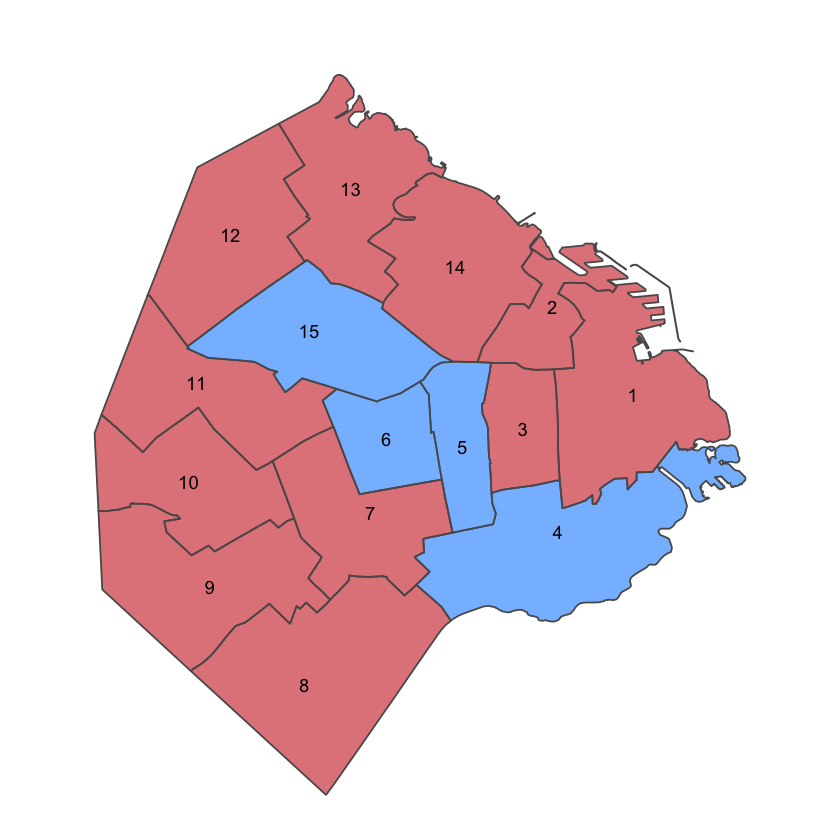

In [114]:

dt <- filter(dataPuntos, Periodo == 2018 & Comuna == "Comuna 15")

#En comuna 1 se encontraron repetidas las Categorias de: "Ferias y Mercados" y "Movilidad .." como ganadoras
radiosComuna1  <- filter(radios, Comuna == "Comuna 1")
radiosComuna2  <- filter(radios, Comuna == "Comuna 2")
radiosComuna3  <- filter(radios, Comuna == "Comuna 3")
radiosComuna4  <- filter(radios, Comuna == "Comuna 4")
#En comuna 5 se encontraron repetidas las Categorias de: "Arte urbano" y "Movilidad .." como ganadoras
radiosComuna5  <- filter(radios, Comuna == "Comuna 5")
#En comuna 6 se encontraron repetidas las Categorias de: "Plazas y Parques" y "Movilidad .." como ganadoras
radiosComuna6  <- filter(radios, Comuna == "Comuna 6")
radiosComuna7  <- filter(radios, Comuna == "Comuna 7")
#En comuna 6 se encontraron repetidas las Categorias de: "deportes y calidad de vida" y "Movilidad .." como ganadoras
radiosComuna8  <- filter(radios, Comuna == "Comuna 8")
radiosComuna9  <- filter(radios, Comuna == "Comuna 9")
#En comuna 6 se encontraron repetidas las Categorias de: "Plazas y Parques" y "Movilidad .." como ganadoras
radiosComuna10  <- filter(radios, Comuna == "Comuna 10")
radiosComuna11  <- filter(radios, Comuna == "Comuna 11")
radiosComuna12  <- filter(radios, Comuna == "Comuna 12")
radiosComuna13  <- filter(radios, Comuna == "Comuna 13")
radiosComuna14  <- filter(radios, Comuna == "Comuna 14")
radiosComuna15  <- filter(radios, Comuna == "Comuna 15")

counts  <- dt %>% group_by(Categoria) %>% tally()
print(counts)

#png(file = "TresCategoriasTodosAnos.png")
mapa2  <- ggplot(radios) +
        geom_sf(data=radiosComuna1, fill = "firebrick3",alpha = .6)+
        geom_sf(data=radiosComuna2, fill = "firebrick3",alpha = .6)+
        geom_sf(data=radiosComuna3, fill = "firebrick3",alpha = .6)+
        geom_sf(data=radiosComuna4, fill = "dodgerblue1",alpha = .6)+
        geom_sf(data=radiosComuna5, fill = "dodgerblue1",alpha = .6)+
        geom_sf(data=radiosComuna6, fill = "dodgerblue1",alpha = .6)+
        geom_sf(data=radiosComuna7, fill = "firebrick3",alpha = .6)+

        geom_sf(data=radiosComuna8, fill = "firebrick3",alpha = .6)+
        geom_sf(data=radiosComuna9, fill = "firebrick3",alpha = .6)+
        geom_sf(data=radiosComuna10, fill = "firebrick3",alpha = .6)+
        geom_sf(data=radiosComuna11, fill = "firebrick3",alpha = .6)+
        geom_sf(data=radiosComuna12, fill = "firebrick3",alpha = .6)+
        geom_sf(data=radiosComuna13, fill = "firebrick3",alpha = .6)+
        geom_sf(data=radiosComuna14, fill = "firebrick3",alpha = .6)+
        geom_sf(data=radiosComuna15, fill = "dodgerblue1",alpha = .6)+

        geom_sf_text(aes(label = COMUNAS))+
            theme_minimal()+
            coord_sf(datum = NA)+
            theme(axis.title.x=element_blank(),
                axis.text.x=element_blank(),
                axis.ticks.x=element_blank(),
                 axis.title.y=element_blank(),
                axis.text.y=element_blank(),
                axis.ticks.y=element_blank(),
                plot.title = element_text(hjust = 0.5))+
            ggtitle("") 
        





mapa2



<h1>Premacía de Propuestas Ganadoras por Comuna </h1>
Año 2019

# A tibble: 3 x 2
  Categoria                n
  <fct>                <int>
1 Cultura                  1
2 Movilidad y transito     1
3 Seguridad                2


Warning message in st_point_on_surface.sfc(sf::st_zm(x)):
“st_point_on_surface may not give correct results for longitude/latitude data”


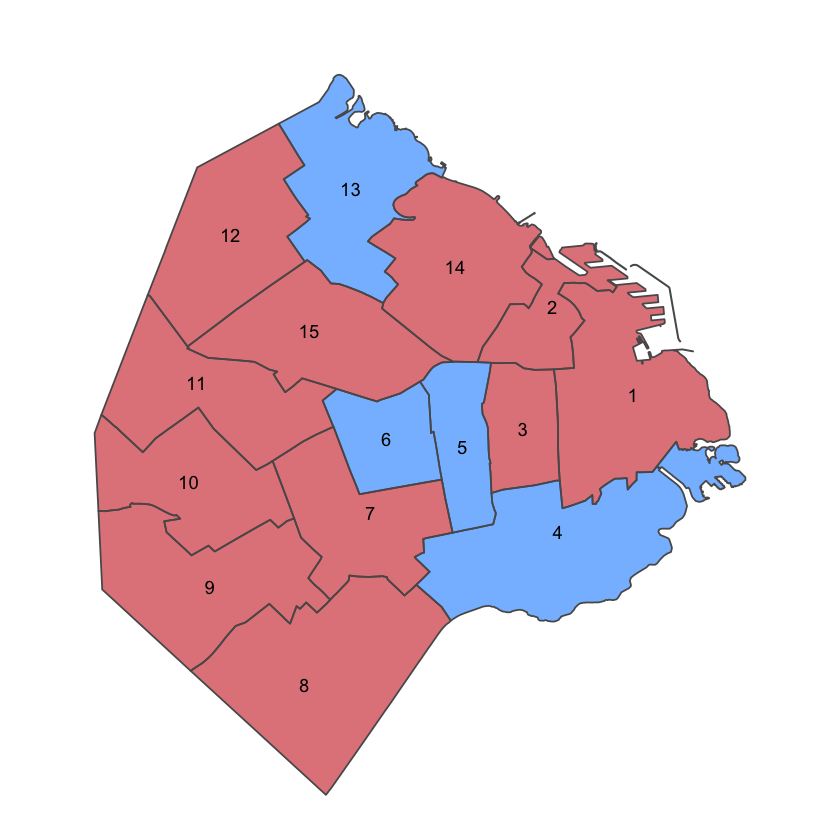

In [115]:

dt <- filter(dataPuntos, Periodo == 2019 & Comuna == "Comuna 15")

#En comuna 1 se encontraron repetidas las Categorias de: "Ferias y Mercados" y "Movilidad .." como ganadoras
radiosComuna1  <- filter(radios, Comuna == "Comuna 1")
radiosComuna2  <- filter(radios, Comuna == "Comuna 2")
radiosComuna3  <- filter(radios, Comuna == "Comuna 3")
radiosComuna4  <- filter(radios, Comuna == "Comuna 4")
#En comuna 5 se encontraron repetidas las Categorias de: "Arte urbano" y "Movilidad .." como ganadoras
radiosComuna5  <- filter(radios, Comuna == "Comuna 5")
#En comuna 6 se encontraron repetidas las Categorias de: "Plazas y Parques" y "Movilidad .." como ganadoras
radiosComuna6  <- filter(radios, Comuna == "Comuna 6")
radiosComuna7  <- filter(radios, Comuna == "Comuna 7")
#En comuna 6 se encontraron repetidas las Categorias de: "deportes y calidad de vida" y "Movilidad .." como ganadoras
radiosComuna8  <- filter(radios, Comuna == "Comuna 8")
radiosComuna9  <- filter(radios, Comuna == "Comuna 9")
#En comuna 6 se encontraron repetidas las Categorias de: "Plazas y Parques" y "Movilidad .." como ganadoras
radiosComuna10  <- filter(radios, Comuna == "Comuna 10")
radiosComuna11  <- filter(radios, Comuna == "Comuna 11")
radiosComuna12  <- filter(radios, Comuna == "Comuna 12")
radiosComuna13  <- filter(radios, Comuna == "Comuna 13")
radiosComuna14  <- filter(radios, Comuna == "Comuna 14")
radiosComuna15  <- filter(radios, Comuna == "Comuna 15")

counts  <- dt %>% group_by(Categoria) %>% tally()
print(counts)

#png(file = "TresCategoriasTodosAnos.png")
mapa3  <- ggplot(radios) +
        geom_sf(data=radiosComuna1, fill = "firebrick3",alpha = .6)+
        geom_sf(data=radiosComuna2, fill = "firebrick3",alpha = .6)+
        geom_sf(data=radiosComuna3, fill = "firebrick3",alpha = .6)+
        geom_sf(data=radiosComuna4, fill = "dodgerblue1",alpha = .6)+
        geom_sf(data=radiosComuna5, fill = "dodgerblue1",alpha = .6)+
        geom_sf(data=radiosComuna6, fill = "dodgerblue1",alpha = .6)+
        geom_sf(data=radiosComuna7, fill = "firebrick3",alpha = .6)+

        geom_sf(data=radiosComuna8, fill = "firebrick3",alpha = .6)+
        geom_sf(data=radiosComuna9, fill = "firebrick3",alpha = .6)+
        geom_sf(data=radiosComuna10, fill = "firebrick3",alpha = .6)+
        geom_sf(data=radiosComuna11, fill = "firebrick3",alpha = .6)+
        geom_sf(data=radiosComuna12, fill = "firebrick3",alpha = .6)+
        geom_sf(data=radiosComuna13, fill = "dodgerblue1",alpha = .6)+
        geom_sf(data=radiosComuna14, fill = "firebrick3",alpha = .6)+
        geom_sf(data=radiosComuna15, fill = "firebrick3",alpha = .6)+
        geom_sf_text(aes(label = COMUNAS))+
            theme_minimal()+
            coord_sf(datum = NA)+
            theme(axis.title.x=element_blank(),
                axis.text.x=element_blank(),
                axis.ticks.x=element_blank(),
                 axis.title.y=element_blank(),
                axis.text.y=element_blank(),
                axis.ticks.y=element_blank(),
                plot.title = element_text(hjust = 0.5))+
            ggtitle("")
mapa3






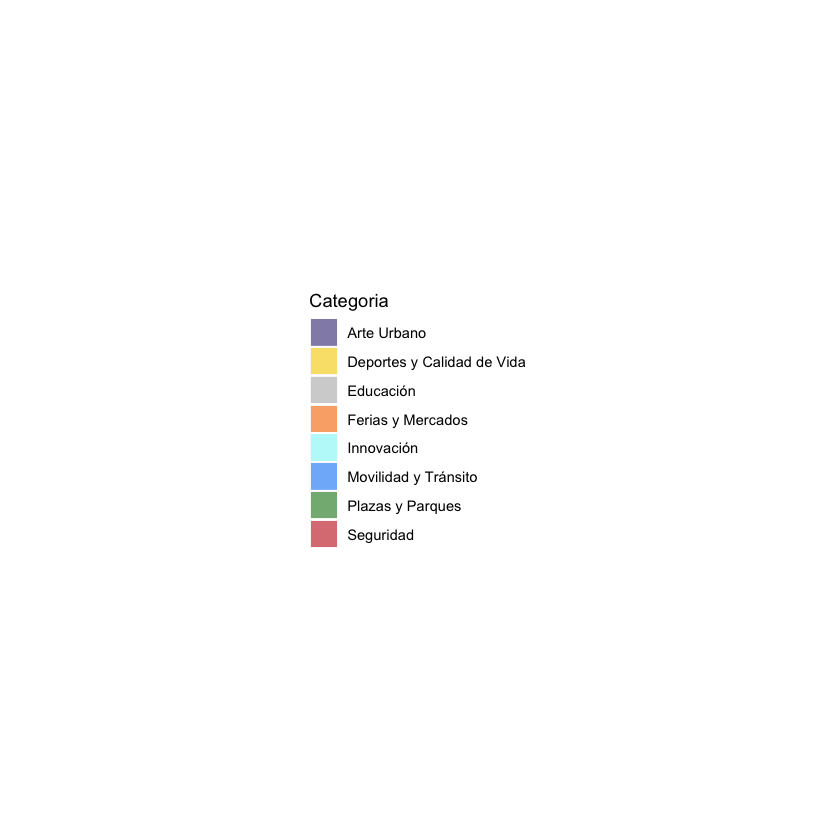

In [120]:
survey <- data.frame(Categoria=c("Arte Urbano", "Deportes y Calidad de Vida","Ferias y Mercados", "Innovación","Educación","Movilidad y Tránsito","Plazas y Parques","Seguridad"),
                     people=c(0.2, 0.2, 0.2, 0.2, 0.2, 0.2,0.2,0.2))


library(ggpubr) 

  r <-       ggplot(survey, aes(x=Categoria, y=people, fill=Categoria)) + 
       geom_bar(stat="identity",alpha = .6) +
       coord_flip() +        scale_fill_manual(values=c("darkslateblue", "gold1", "grey","darkorange1","darkslategray1","dodgerblue1", "forestgreen", "firebrick3"))

leg <- get_legend(r)

# Convert to a ggplot and print
d <-  as_ggplot(leg)
d



Warning message in st_point_on_surface.sfc(sf::st_zm(x)):
“st_point_on_surface may not give correct results for longitude/latitude data”
Warning message in st_point_on_surface.sfc(sf::st_zm(x)):
“st_point_on_surface may not give correct results for longitude/latitude data”
Warning message in st_point_on_surface.sfc(sf::st_zm(x)):
“st_point_on_surface may not give correct results for longitude/latitude data”


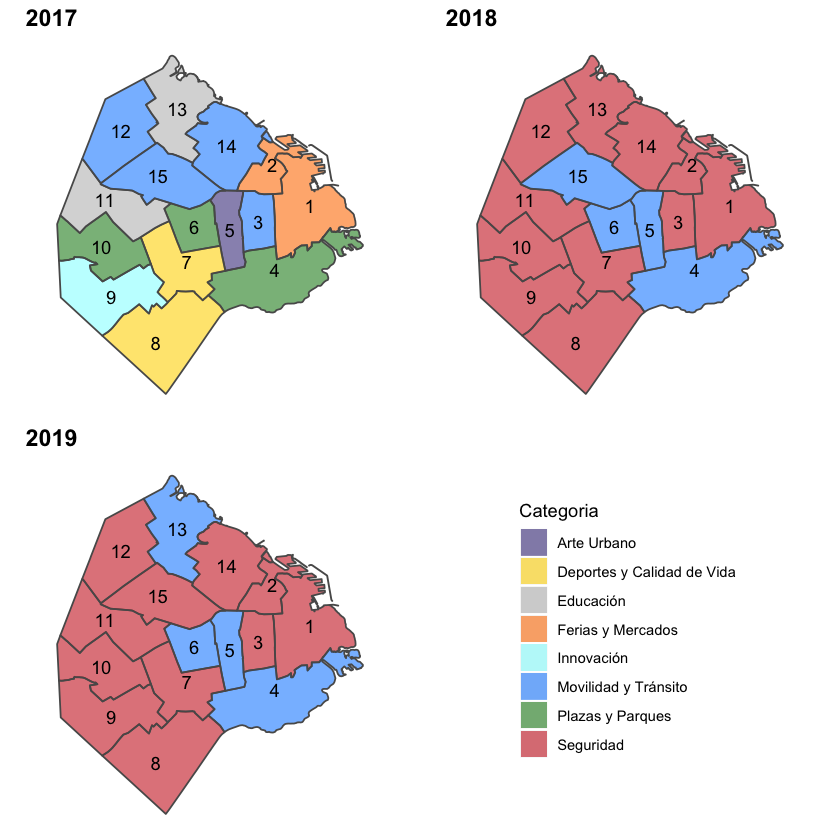

In [117]:
library(ggpubr)

#pdf(file = "PremaciasPorCategoria.pdf")

ggarrange(mapa1, mapa2, mapa3, d + rremove("x.text"), 
          labels = c("2017", "2018", "2019",""),
          ncol = 2, nrow = 2)

#dev.off()

ERROR: Error: Cannot use `+.gg()` with a single argument. Did you accidentally put + on a new line?


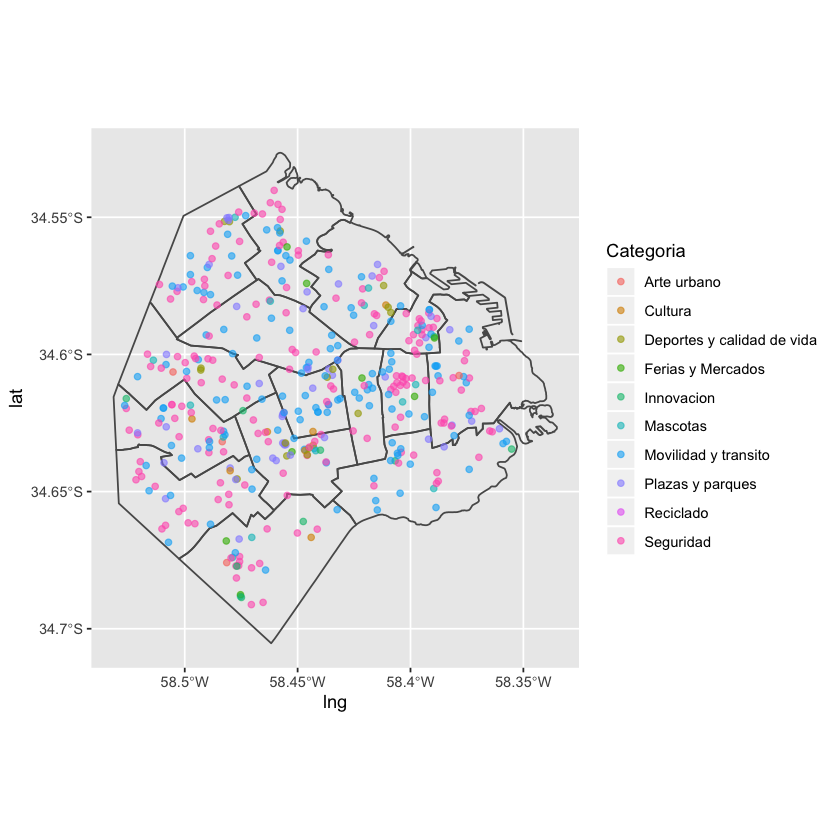

In [154]:
dt <- filter(dataPuntos, Periodo == 2018)

#png(file = "TresCategoriasTodosAnos.png")
ggplot(radios) +
    geom_sf(data=radios, fill=NA)+
    geom_point(data = dt, aes(x = lng, y = lat, colour = Categoria), alpha = .6)
    + geom_histogram(fill = dt$Categoria)+
    geom_sf_text(aes(label = COMUNAS))+
    theme_minimal()+
    coord_sf(datum = NA)+
    theme(axis.title.x=element_blank(),
        axis.text.x=element_blank(),
        axis.ticks.x=element_blank(),
         axis.title.y=element_blank(),
        axis.text.y=element_blank(),
        axis.ticks.y=element_blank(),
        plot.title = element_text(hjust = 0.5))+
    ggtitle("2018") 
#dev.off()

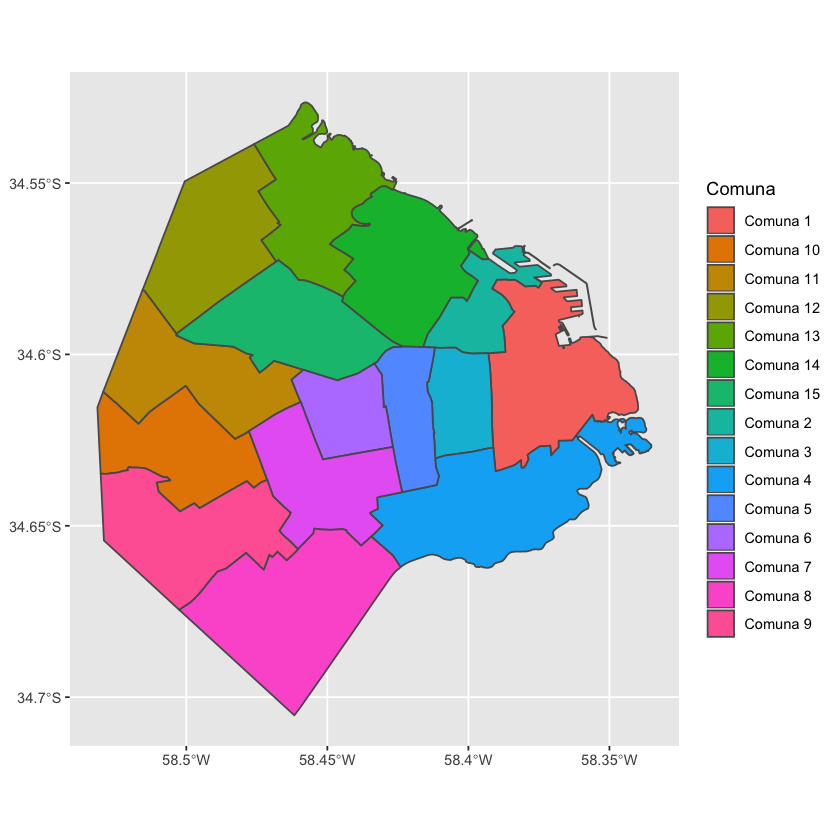

In [172]:
dt <- filter(dataPuntos, Periodo == 2019)

#png(file = "TresCategoriasTodosAnos.png")
ggplot(radios) +
    geom_sf(data=radios, aes(fill = Comuna))

Warning message in st_point_on_surface.sfc(sf::st_zm(x)):
“st_point_on_surface may not give correct results for longitude/latitude data”


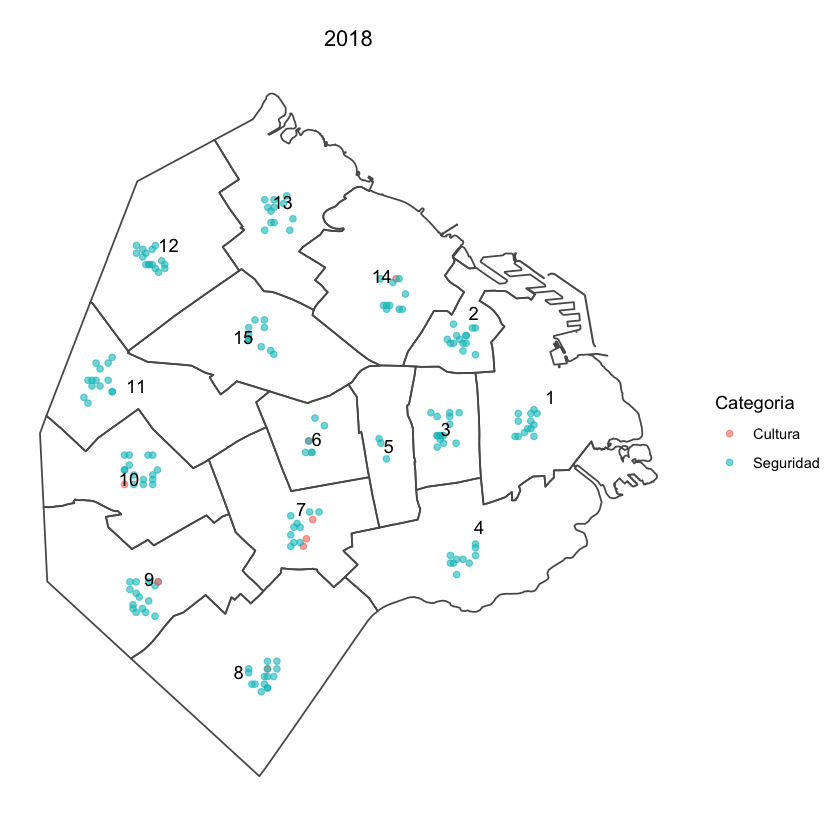

In [141]:
data_2019 <- filter(data, Periodo == 2018 & (Categoria == "Seguridad" | Categoria == "Cultura"))
ggplot(radios) +
    geom_sf(data=radios, fill=NA)+
    geom_point(data = data_2019, aes(x = lng, y = lat, colour = Categoria), alpha = .6)+
    geom_sf_text(aes(label = COMUNAS))+
    theme_minimal()+
    coord_sf(datum = NA)+
    theme(axis.title.x=element_blank(),
        axis.text.x=element_blank(),
        axis.ticks.x=element_blank(),
         axis.title.y=element_blank(),
        axis.text.y=element_blank(),
        axis.ticks.y=element_blank(),
        plot.title = element_text(hjust = 0.5))+
    ggtitle("2018") 


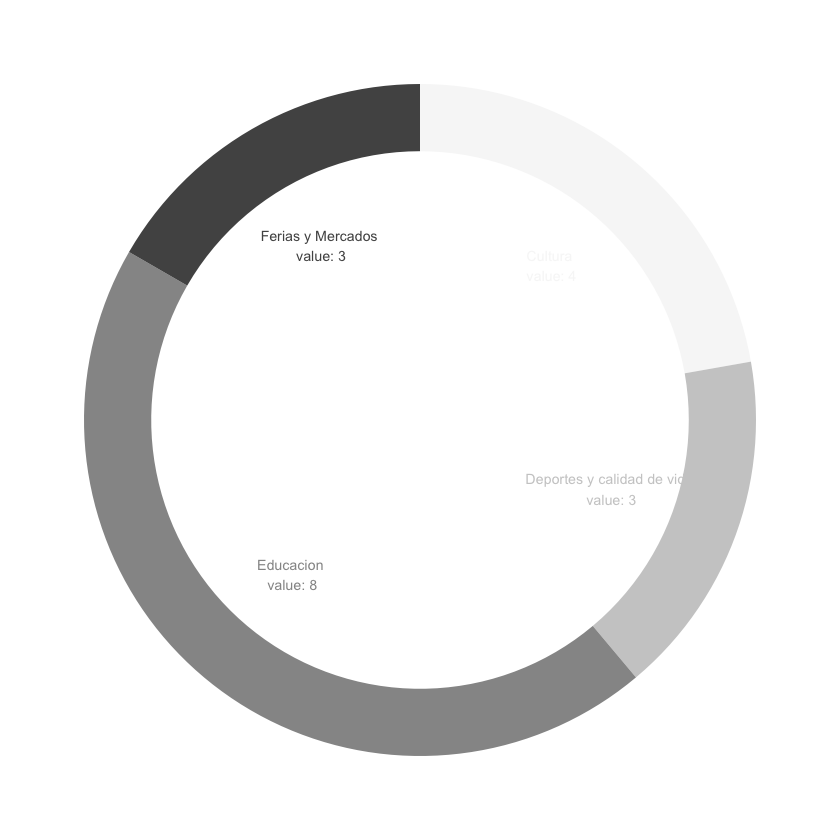

In [78]:

# Create test data.
data <- data.frame(
  category=c("Cultura", "Deportes y calidad de vida", "Educacion","Ferias y Mercados"),
  count=c(4, 3, 8,3)
)
 
# Compute percentages
data$fraction <- data$count / sum(data$count)

# Compute the cumulative percentages (top of each rectangle)
data$ymax <- cumsum(data$fraction)

# Compute the bottom of each rectangle
data$ymin <- c(0, head(data$ymax, n=-1))

# Compute label position
data$labelPosition <- (data$ymax + data$ymin) / 2

# Compute a good label
data$label <- paste0(data$category, "\n value: ", data$count)

# Make the plot
ggplot(data, aes(ymax=ymax, ymin=ymin, xmax=4, xmin=3, fill=category)) +
  geom_rect() +
  geom_text( x=2, aes(y=labelPosition, label=label, color=category), size=3) + # x here controls label position (inner / outer)
  scale_fill_brewer(palette=6) +
  scale_color_brewer(palette=6) +
  coord_polar(theta="y") +
  xlim(c(-1, 4)) +
  theme_void() +
  theme(legend.position = "none")





In [2]:
dt2019 <- filter(dataPuntos, Periodo == 2019 & (Categoria == "Ferias y Mercados"))
number_rows  <- nrow(dt2019)
print(number_rows)



# Create test data.
data <- data.frame(
  category=c("Cultura", "Deportes y calidad de vida", "Educacion","Ferias y Mercados"),
  count=c(4, 3, 8,3)
)
 

[1] 0


Linking to GEOS 3.7.2, GDAL 2.4.2, PROJ 5.2.0

Loading required package: sp


Attaching package: ‘dplyr’


The following objects are masked from ‘package:raster’:

    intersect, select, union


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


To access larger datasets in this package, install the spDataLarge
package with: `install.packages('spDataLarge',
repos='https://nowosad.github.io/drat/', type='source')`



In [105]:

votosApoyos <- read.table('propuestasGanadoras.csv', header = TRUE, sep = ",", dec = ".", fill =TRUE, comment.char = "", strip.white = TRUE,
                         stringsAsFactors = TRUE)

apoyos  <- filter(votosApoyos, tipo == "Apoyos")
votos  <- filter(votosApoyos, tipo == "Votos")

votos_2017  <- filter(votos, Periodo == 2017)
votos_2018  <- filter(votos, Periodo == 2018)
votos_2019  <- filter(votos, Periodo == 2019)

apoyos_2017  <- filter(apoyos, Periodo == 2017)
apoyos_2018  <- filter(apoyos, Periodo == 2018)
apoyos_2019  <- filter(apoyos, Periodo == 2019)

factor  <- 50


leaflet(data = radios) %>%
    addPolygons(
        stroke = FALSE, 
        color = "black",
        fillColor = "grey",
        fillOpacity = 0.3, smoothFactor = 0.5) %>%
    addCircles(lng = votos_2017$lng, lat = votos_2017$lat, weight = 1,  popup=paste("Categoría:", votos_2017$Categoria, "<br>",
                         "Número de Votos:", votos_2017$cantidad, "<br>", 
                         "Título de Propuesta:", votos_2017$titulo, "<br>"), 
        radius = ~sqrt(votos_2017$cantidad) * factor) %>%
    addCircles(lng = votos_2018$lng, lat = votos_2018$lat, color = "Red", weight = 1,  popup=paste("Categoría:", votos_2018$Categoria, "<br>",
                         "Número de Votos:", votos_2018$cantidad, "<br>", 
                         "Título de Propuesta:", votos_2018$titulo, "<br>"), 
        radius = ~sqrt(votos_2018$cantidad) * factor) %>%
    addCircles(lng = votos_2019$lng, lat = votos_2019$lat, color ="Green", weight = 1,  popup=paste("Categoría:", votos_2019$Categoria, "<br>",
                         "Número de Votos:", votos_2019$cantidad, "<br>", 
                         "Título de Propuesta:", votos_2019$titulo, "<br>"), 
        radius = ~sqrt(votos_2019$cantidad) * factor) %>%
  addTiles()






HTML widgets cannot be represented in plain text (need html)

In [104]:
################################# APOYOS #########################################################
leaflet(data = radios) %>%
    addPolygons(
        stroke = FALSE, 
        color = "black",
        fillColor = "grey",
        fillOpacity = 0.3, smoothFactor = 0.5) %>%
    addCircles(lng = apoyos_2017$lng, lat = apoyos_2017$lat, weight = 1,  popup=paste("Categoría:", apoyos_2017$Categoria, "<br>",
                         "Número de Votos:", apoyos_2017$cantidad, "<br>", 
                         "Título de Propuesta:", apoyos_2017$titulo, "<br>"), 
        radius = ~sqrt(apoyos_2017$cantidad) * factor) %>%
    addCircles(lng = apoyos_2018$lng, lat = apoyos_2018$lat, color = "Red", weight = 1,  popup=paste("Categoría:", apoyos_2018$Categoria, "<br>",
                         "Número de Votos:", apoyos_2018$cantidad, "<br>", 
                         "Título de Propuesta:", apoyos_2018$titulo, "<br>"), 
        radius = ~sqrt(apoyos_2018$cantidad) * factor) %>%
    addCircles(lng = apoyos_2019$lng, lat = apoyos_2019$lat, color ="Green", weight = 1,  popup=paste("Categoría:", apoyos_2019$Categoria, "<br>",
                         "Número de Votos:", apoyos_2019$cantidad, "<br>", 
                         "Título de Propuesta:", apoyos_2019$titulo, "<br>"), 
        radius = ~sqrt(apoyos_2019$cantidad) * factor) %>%
  addTiles()



HTML widgets cannot be represented in plain text (need html)

In [107]:

votosApoyos <- read.table('propuestasGanadoras.csv', header = TRUE, sep = ",", dec = ".", fill =TRUE, comment.char = "", strip.white = TRUE,
                         stringsAsFactors = TRUE)

apoyos  <- filter(votosApoyos, tipo == "Apoyos")
votos  <- filter(votosApoyos, tipo == "Votos")

votos  <- filter(votos, Periodo == 2017 & tipo == "Votos" )


apoyos  <- filter(apoyos, Periodo == 2017  & tipo == "Apoyos")


factor  <- 50


leaflet(data = radios) %>%
    addPolygons(
        stroke = FALSE, 
        color = "black",
        fillColor = "grey",
        fillOpacity = 0.3, smoothFactor = 0.5) %>%
    addCircles(lng = votos$lng, lat = votos$lat, weight = 1,  popup=paste("Categoría:", votos$Categoria, "<br>",
                         "Número de Votos:", votos$cantidad, "<br>", 
                         "Título de Propuesta:", votos$titulo, "<br>"), 
        radius = ~sqrt(votos$cantidad) * factor) %>%
    addCircles(lng = apoyos$lng, lat = apoyos$lat, color = "Red", weight = 1,  popup=paste("Categoría:", apoyos$Categoria, "<br>",
                         "Número de Votos:", apoyos$cantidad, "<br>", 
                         "Título de Propuesta:", apoyos$titulo, "<br>"), 
        radius = ~sqrt(apoyos$cantidad) * factor) %>%
  addTiles()


HTML widgets cannot be represented in plain text (need html)

In [108]:
votosApoyos <- read.table('propuestasGanadoras.csv', header = TRUE, sep = ",", dec = ".", fill =TRUE, comment.char = "", strip.white = TRUE,
                         stringsAsFactors = TRUE)

apoyos  <- filter(votosApoyos, tipo == "Apoyos")
votos  <- filter(votosApoyos, tipo == "Votos")

votos  <- filter(votos, Periodo == 2018 & tipo == "Votos" )


apoyos  <- filter(apoyos, Periodo == 2018  & tipo == "Apoyos")


factor  <- 50


leaflet(data = radios) %>%
    addPolygons(
        stroke = FALSE, 
        color = "black",
        fillColor = "grey",
        fillOpacity = 0.3, smoothFactor = 0.5) %>%
    addCircles(lng = votos$lng, lat = votos$lat, weight = 1,  popup=paste("Categoría:", votos$Categoria, "<br>",
                         "Número de Votos:", votos$cantidad, "<br>", 
                         "Título de Propuesta:", votos$titulo, "<br>"), 
        radius = ~sqrt(votos$cantidad) * factor) %>%
    addCircles(lng = apoyos$lng, lat = apoyos$lat, color = "Red", weight = 1,  popup=paste("Categoría:", apoyos$Categoria, "<br>",
                         "Número de Votos:", apoyos$cantidad, "<br>", 
                         "Título de Propuesta:", apoyos$titulo, "<br>"), 
        radius = ~sqrt(apoyos$cantidad) * factor) %>%
  addTiles()

HTML widgets cannot be represented in plain text (need html)

In [127]:
votosApoyos <- read.table('propuestasGanadoras.csv', header = TRUE, sep = ",", dec = ".", fill =TRUE, comment.char = "", strip.white = TRUE,
                         stringsAsFactors = TRUE)

apoyos  <- filter(votosApoyos, tipo == "Apoyos")
votos  <- filter(votosApoyos, tipo == "Votos")

votos  <- filter(votos, Periodo == 2019 & tipo == "Votos" )


apoyos  <- filter(apoyos, Periodo == 2019  & tipo == "Apoyos")


factor  <- 50


leaflet(data = radios) %>%
    addPolygons(
        stroke = FALSE, 
        color = "black",
        fillColor = "grey",
        fillOpacity = 0.3, smoothFactor = 0.5) %>%
    addCircles(lng = votos$lng, lat = votos$lat, weight = 1,  popup=paste("Categoría:", votos$Categoria, "<br>",
                         "Número de Votos:", votos$cantidad, "<br>", 
                         "Título de Propuesta:", votos$titulo, "<br>"), 
        radius = ~sqrt(votos$cantidad) * factor) %>%
    addCircles(lng = apoyos$lng, lat = apoyos$lat, color = "Red", weight = 1,  popup=paste("Categoría:", apoyos$Categoria, "<br>",
                         "Número de Votos:", apoyos$cantidad, "<br>", 
                         "Título de Propuesta:", apoyos$titulo, "<br>"), 
        radius = ~sqrt(apoyos$cantidad) * factor) %>%
  addTiles()

HTML widgets cannot be represented in plain text (need html)

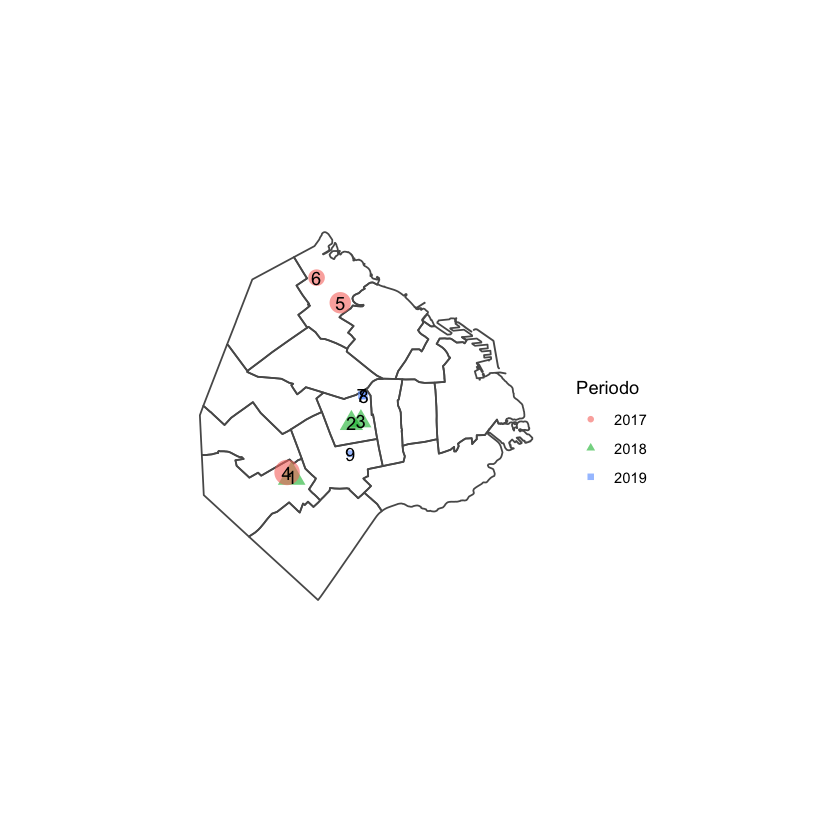

In [207]:

votosApoyos <- read.table('propuestasGanadoras.csv', header = TRUE, sep = ",", dec = ".", fill =TRUE, comment.char = "", strip.white = TRUE,
                         stringsAsFactors = TRUE)
votosApoyos$Periodo <- as.factor(votosApoyos$Periodo)
votosApoyos$id <- as.factor(votosApoyos$id)
apoyos  <- filter(votosApoyos,tipo == "Votos" )
#png(file = "TresCategoriasTodosAnos.png")
mapa  <- ggplot(radios) +
        geom_sf(data=radios, fill=NA)+
            geom_point(data = apoyos, aes(x = lng, y = lat, colour = Periodo, shape = Periodo), alpha = .6,size = apoyos$cantidad/150)+
            geom_text(data = apoyos, aes(x =lng, y = lat, label = id))+
            theme_minimal()+
            coord_sf(datum = NA)+
            theme(axis.title.x=element_blank(),
                axis.text.x=element_blank(),
                axis.ticks.x=element_blank(),
                 axis.title.y=element_blank(),
                axis.text.y=element_blank(),
                axis.ticks.y=element_blank(),
                plot.title = element_text(hjust = 0.5))+
            ggtitle("") + labs(color="Periodo")+
                    ylim(-34.8, -34.45)
mapa

In [211]:
library("grid")
##TODO: Check grid library 
votosApoyos <- read.table('propuestasGanadoras.csv', header = TRUE, sep = ",", dec = ".", fill =TRUE, comment.char = "", strip.white = TRUE,
                         stringsAsFactors = TRUE)
votosApoyos$Periodo <- as.factor(votosApoyos$Periodo)
votosApoyos$id <- as.factor(votosApoyos$id)
apoyos  <- filter(votosApoyos,tipo == "Apoyos" )
#png(file = "TresCategoriasTodosAnos.png")
mapa  <- ggplot(radios) +
        geom_sf(data=radios, fill=NA)+
            geom_point(data = apoyos, aes(x = lng, y = lat, colour = Periodo, shape = Periodo), alpha = .6,size = apoyos$cantidad/100)+
           
            geom_text_repel(
                
                data = apoyos,
                aes(x =lng, y = lat, label = id),
                size = 5,
                box.padding = unit(0.35, "lines"),
                point.padding = unit(0.3, "lines")
            )+

            theme_minimal()+
            coord_sf(datum = NA)+
            theme(axis.title.x=element_blank(),
                axis.text.x=element_blank(),
                axis.ticks.x=element_blank(),
                 axis.title.y=element_blank(),
                axis.text.y=element_blank(),
                axis.ticks.y=element_blank(),
                plot.title = element_text(hjust = 0.5))+
            ggtitle("") + labs(color="Periodo")+
                    ylim(-34.8, -34.45)
mapa

ERROR: Error in geom_text_repel(data = apoyos, aes(x = lng, y = lat, label = id), : could not find function "geom_text_repel"
